[**Source for the guide**](https://www.learnml.io/posts/a-guide-to-bounding-box-formats/)

The bounding box to use will depend on the framework, model and existing data you are trying to use.

e.g.:
- **PyTorch** - using PyTorch pre-trained models, you will want to use the absolute `XYXY` format `([x1, y1, x2, y2])`.
- **Hugging Face Transformers** - using Hugging Face Transformers models such as `Conditional DETR`, the outputs from the model can of one type (e.g. `CXCYWH`) but they can be post-processed into another type, (e.g. absolute XYXY).
- **Ultralytics YOLO** - using such a model you will want `normalized CXCYWH` `([center_x, center_y, width, height])` format.
- **Google Gemini** - using Google Gemini to predict bounding boxes on images, the format will be `[y_min, x_min, y_max, x_max]` (`XYXY`) normalized coordinates.

In [ ]:
import json
import requests

url = "https://raw.githubusercontent.com/mrdbourke/learn-ml/refs/heads/main/posts/a-guide-to-bounding-box-formats/data/trashify_demo_image_annotations.json"

content = requests.get(url).text
annotations = json.loads(content)

annotations

{'image_path': 'trashify_demo_image_for_box_format.jpeg',
 'file_name': '7c9b2934-23bc-46c5-8e9f-c2a66948b653.jpeg',
 'readme': 'Demo image for displaying box formats on. Box coordinates in annotations dict come in absolute XYWH format. Image size is in (height, width) format.',
 'annotations': [{'id': '4226a4fb-12b2-4e16-b29d-b33d667048d1',
   'label': 'bin',
   'color': 'magenta',
   'x': 8.9,
   'y': 275.3,
   'height': 688.7,
   'width': 858.6,
   'center': [438.2, 619.65],
   'type': 'rect',
   'points': [[8.9, 275.3], [8.9, 964], [867.5, 964], [867.5, 275.3]]}],
 'image_size': [1280, 960]}

In [ ]:
# annotations dictionary
annotations_dict = annotations['annotations'][0]

# Extract x, y, width, height
box_top_left_x = annotations_dict['x']
box_top_left_y = annotations_dict['y']
box_width = annotations_dict['width']
box_height = annotations_dict['height']

# Construct an array for an XYWH format
box_xywh = [box_top_left_x, box_top_left_y, box_width, box_height]
print(f"Box in XYWH format: {box_xywh}")

Box in XYWH format: [8.9, 275.3, 858.6, 688.7]


### Converting existing `box_xywh` to other formats. (using `torchvision.ops.box_convert` function)

In [ ]:
import torch
from torchvision.ops import box_convert

# Convert XYWH to XYXY & CXCYWH
box_xyxy = box_convert(boxes=torch.tensor(box_xywh), in_fmt='xywh', out_fmt='xyxy')
box_cxcywh = box_convert(boxes=torch.tensor(box_xywh), in_fmt='xywh', out_fmt='cxcywh')

print(f"Box in XYWH format: {box_xywh}")
print(f"Box in XYXY fomrat: {[round(x, 1) for x in box_xyxy.tolist()]}") # convert the tensor back to a list
print(f"Box in CXCYWH format: {[round(x, 1) for x in box_cxcywh.tolist()]}")

Box in XYWH format: [8.9, 275.3, 858.6, 688.7]
Box in XYXY fomrat: [8.9, 275.3, 867.5, 964.0]
Box in CXCYWH format: [438.2, 619.7, 858.6, 688.7]


### Manually converting bounding box formats
To convert XYWH to XYXY:
- x_min and y_min remain the same.
- Add the box_width to x_min to create x_max.
- Add the box_height to y_min to create y_max.

In [ ]:
# Convert XYWH to XYXY
box_xyxy = [0, 0, 0, 0] # start with zeros

box_xyxy[0] = box_xywh[0]
box_xyxy[1] = box_xywh[1]

box_xyxy[2] = box_xywh[0] + box_xywh[2]

box_xyxy[3] = box_xywh[1] + box_xywh[3]

print(f"box in xyxy format: {box_xyxy}")

box in xyxy format: [8.9, 275.3, 867.5, 964.0]


### Convert XYWH to CXCYWH format

In [ ]:
box_cxcywh = [0, 0, 0, 0] # initialize

# Create a box_center_x by adding 0.5 * box_width to x_min
box_center_x = round(box_xywh[0] + (0.5 * box_xywh[2]), 1)
box_cxcywh[0] = box_center_x

# Create box_center_y by adding 0.5 * box_height to y_min
box_center_y = round(box_xywh[1] + (0.5 * box_xywh[3]), 1)
box_cxcywh[1] = box_center_y

# The box_width and box_height can remain the same as XYWH
box_cxcywh[2] = box_xywh[2]
box_cxcywh[3] = box_xywh[3]

print(f"Box in CXCYWH format: {box_cxcywh}")

Box in CXCYWH format: [438.2, 619.7, 858.6, 688.7]


## **Creating normalized bounding box coordinates**

In [ ]:
# import requests
# from PIL import Image

# image_url = "https://github.com/mrdbourke/learn-ml/blob/main/posts/a-guide-to-bounding-box-formats/data/trashify_demo_image_for_box_format.jpeg?raw=true"

# image_filename = "image_sample.jpeg"
# with requests.get(image_url, stream=True, timeout=20) as response:
#   response.raise_for_status()
#   with open(image_filename, "wb") as file:
#     for chunk in response.iter_content(chunk_size=8192):
#       file.write(chunk)

# image = Image.open(image_filename)
# # Image dimensions
# img_width, img_height = image.size

# print(f"Image width, height: {img_width, img_height}")
# image


Image width, height: (960, 1280)


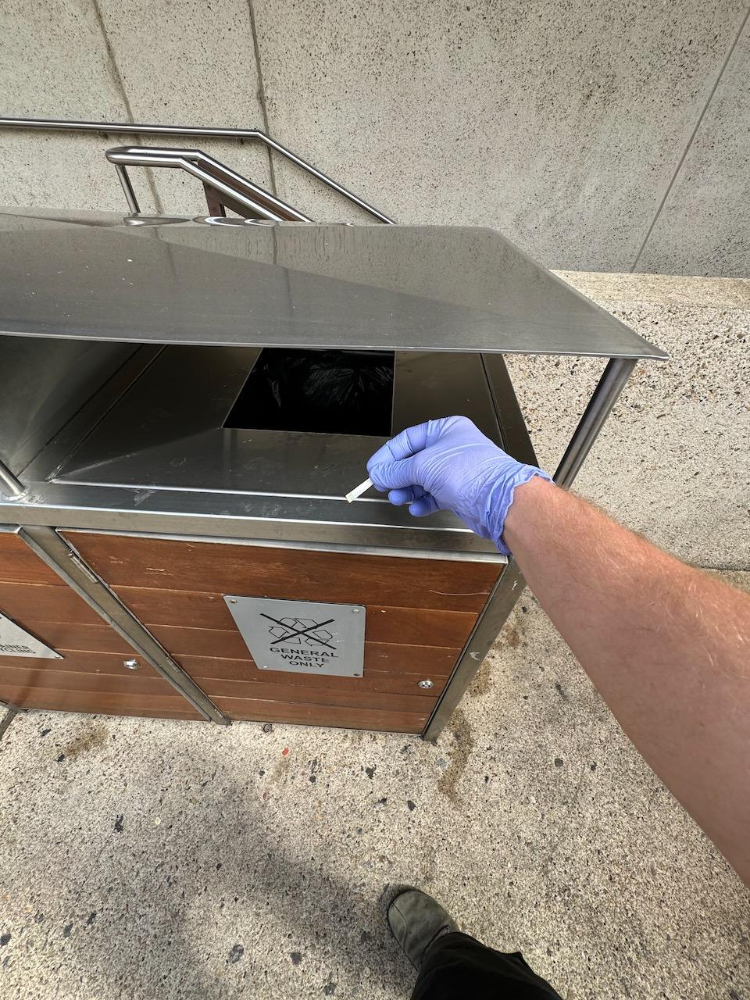

In [ ]:
# Download the image
from PIL import Image
import requests

image_link = "https://github.com/mrdbourke/learn-ml/blob/main/posts/a-guide-to-bounding-box-formats/data/trashify_demo_image_for_box_format.jpeg?raw=true"
request = requests.get(image_link)
image_path = "sample_image.jpeg"

with open(image_path, 'wb') as f:
  f.write(request.content)

image = Image.open(image_path)

# Image dimensions
img_width, img_height = image.size

print(f"Image width, height: {img_width, img_height}")

image

**Creating normalized coordinates**
- Divide x coordinates by the image width.
- Divide y cooridnates by the image height.
- Divide box_width by image width.
- Divide box_height by image height.

In [ ]:
# Divide x coordinates by image width
box_top_left_x_normalized = round(box_top_left_x / img_width, 3)
box_bottom_right_x_normalized = round((box_top_left_x + box_width) / img_width, 3) # (x_min + box_width) / img_width
box_center_x_normalized = round(box_center_x / img_width, 3)

# Divide y coordinates by image height
box_top_left_y_normalized = round(box_top_left_y / img_height, 3)
box_bottom_right_y_normalized = round((box_top_left_y + box_center_y)/img_height, 3)
box_center_y_normalized = round(box_center_y / img_height, 3)

# Divide box width by image width
box_width_normalized = round(box_width / img_width, 3)

# Divide box_height by image_height
box_height_normalized = round(box_height / img_height, 3)

print("🔔 Box x coordinates normalized:")
print(f"Box top left x normalized (x_min): {box_top_left_x_normalized}")
print(f"Box bottom right x normalized (x_max): {box_bottom_right_x_normalized}")
print(f"Box center x normalized (center_x): {box_center_x_normalized}\n")

print("🔔 Box y coordinates normalized:")
print(f"Box top left y normalized (y_min): {box_top_left_y_normalized}")
print(f"Box bottom right y normalized (y_max): {box_bottom_right_y_normalized}")
print(f"Box center y normalized (center_y): {box_center_y_normalized}\n")

print("🔔 Box height and width normalized:")
print(f"Box width normalized: {box_width_normalized}")
print(f"Box height normalized: {box_height_normalized}")

🔔 Box x coordinates normalized:
Box top left x normalized (x_min): 0.009
Box bottom right x normalized (x_max): 0.904
Box center x normalized (center_x): 0.456

🔔 Box y coordinates normalized:
Box top left y normalized (y_min): 0.215
Box bottom right y normalized (y_max): 0.699
Box center y normalized (center_y): 0.484

🔔 Box height and width normalized:
Box width normalized: 0.894
Box height normalized: 0.538


In [ ]:
# Create a normalized XYWH box ([x_min, y_min, box_width, box_height])
box_xywh_normalized = [box_top_left_x_normalized, box_top_left_y_normalized, box_width_normalized, box_height_normalized]

# Create normalized XYXY box ([x_min, y_min, x_max, y_max])
box_xyxy_normalized = [box_top_left_x_normalized, box_top_left_y_normalized, box_bottom_right_x_normalized, box_bottom_right_y_normalized]

# Create normalized CXCYWH box ([center_x, center_y, box_width, box_height])
box_cxcywh_normalized = [box_center_x_normalized, box_center_y_normalized, box_width_normalized, box_height_normalized]

print(f"Box XYWH format normalized: {box_xywh_normalized}")
print(f"Box XYXY format normalized: {box_xyxy_normalized}")
print(f"Box CXCYWH format normalized: {box_cxcywh_normalized}")

Box XYWH format normalized: [0.009, 0.215, 0.894, 0.538]
Box XYXY format normalized: [0.009, 0.215, 0.904, 0.699]
Box CXCYWH format normalized: [0.456, 0.484, 0.894, 0.538]


## **Drawing bounding boxes on images**
Ways to draw bounding boxes on images in Python:
- `PIL.ImageDraw.rectangle`: takes in box coordinates in the form XYXY. You can add text to teh image (for the class name) using `PIL.ImageDraw.text`.
- Using `matplotlib.patches.Rectangle`; takes an anchor point `xy` as well as a `width` and `height` parameter of how big the box is. You can add text to matplotlib plot via `matplotlib.pyplot.text`.
- Using `torch.utils.draw_bounding_boxes` takes in an image tensor and boxes in the form XYXY.

In [ ]:
# Setting up couple of variables to reuse
# Get the box label from the annotations dictionary
box_label = annotations_dict["label"]

# Get the box colour from the annotations dictionary
box_colour = annotations_dict["color"]

print(f"Box label: {box_label}")
print(f"Box colour: {box_colour}")

Box label: bin
Box colour: magenta


### Drawing a good bounding box with `PIL`

Drawing box: [8.9, 275.3, 867.5, 964.0] (XYXY), label: bin


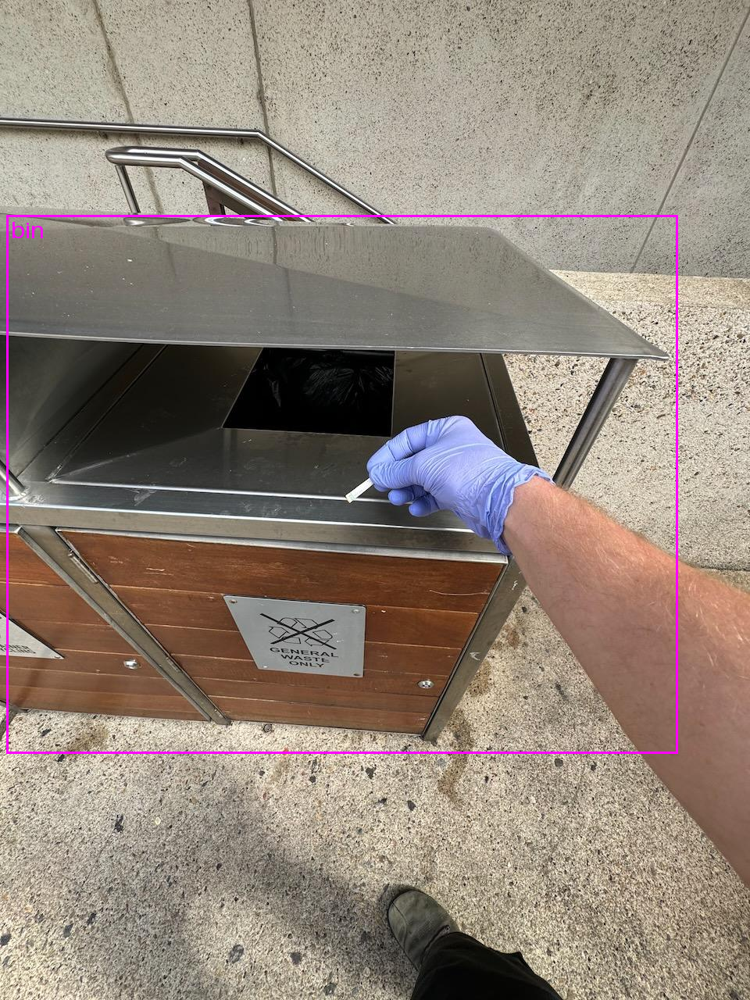

In [ ]:
from PIL import Image, ImageDraw, ImageFont

image = Image.open("sample_image.jpeg")

# Create a draw object and get the image font
draw = ImageDraw.Draw(image)
font = ImageFont.load_default(size=30)

print(f"Drawing box: {box_xyxy} (XYXY), label: {box_label}")
draw.rectangle(
    xy=box_xyxy, # XYXY format
    outline=box_colour, ###
    width=3
)

# Add text to the box and showcase the label name
draw.text(
    xy=(box_top_left_x + 5, box_top_left_y),
    text=box_label,
    fill=box_colour,
    font=font
)

del draw

image

### Drawing a poor boundign box with `PIL`
passing the wrong box format to be drawn

Trying to plot a box in CXCYWH format instead of XYXY.

[INFO] Drawing box: [438.2, 619.7, 858.6, 688.7] (CXCYWH), label: bin


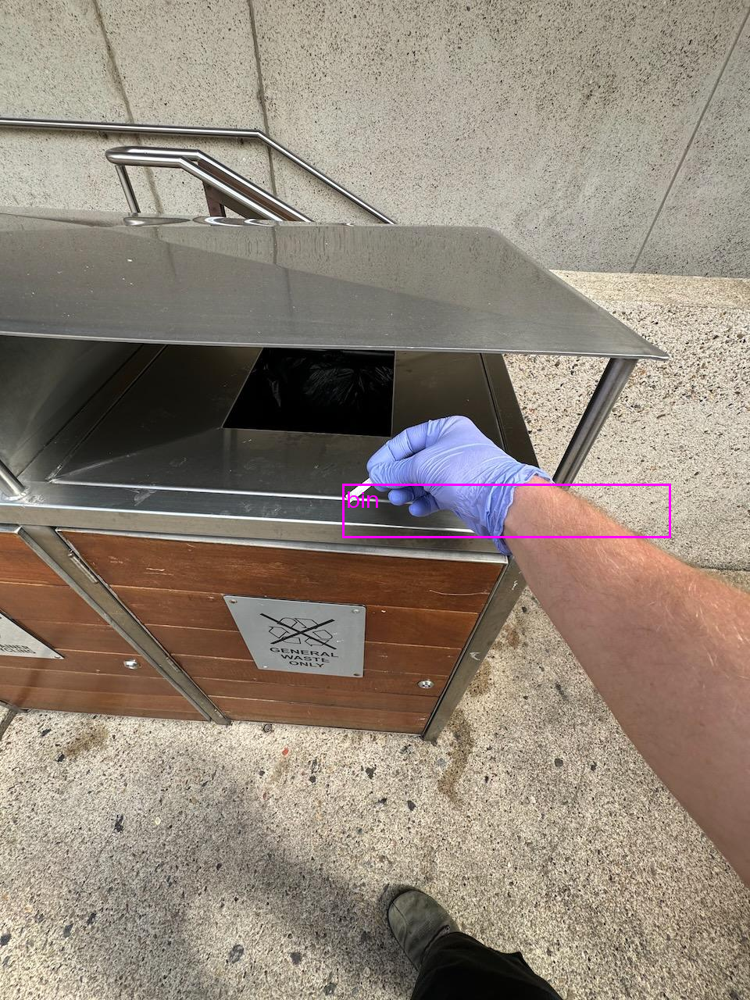

In [ ]:
from PIL import Image, ImageDraw, ImageFont

image = Image.open("sample_image.jpeg")

draw = ImageDraw.Draw(image)
font = ImageFont.load_default(size=30)

# Passing CXCYWH format instead of XYXY format
print(f"[INFO] Drawing box: {box_cxcywh} (CXCYWH), label: {box_label}")
draw.rectangle(
    xy=box_cxcywh, # CXCYWH instead of XYXY format
    outline=box_colour,
    width=3
)

# Add text to the box to showcase the label name
draw.text(
    xy=(box_center_x + 5, box_center_y),
    text=box_label,
    fill=box_colour,
    font=font
)

del draw

image

In [ ]:
import os

file_dir = "images"
os.makedirs(file_dir, exist_ok=True)

## **Drawing bounding boxes with `matplotlib`**

- Show images with `matplotlib.pyplot.imshow`
- Show rectangles with `matplotlib.patches.Rectangle`
- Show text with `matplotlib.pyplot.text`
- Draw arrows with `matplotlib.pyplot.annotate`

In [ ]:
# Set sizing and colour options
CIRCLE_SIZE = 75
CIRLCE_COLOUR = "green"

### **Using absolute values**

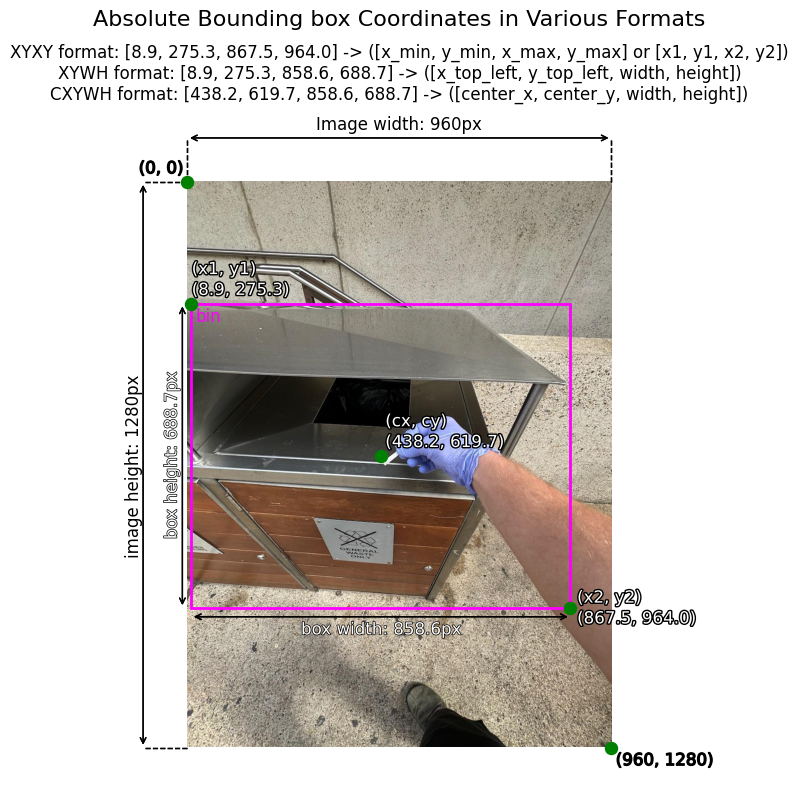

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import patheffects # Allows you to apply visual effects to plot elements like text, lines, and shapes
from PIL import Image
import numpy as np

# Read the image
image = Image.open("sample_image.jpeg")
img_width, img_height = image.size
img_array = np.array(image)

# Create figure and axis with larger figure size
fig, ax = plt.subplots(figsize=(12, 8))

# Display the image
ax.imshow(img_array)

# Add padding around the image (in pixels)
padding = 150
ax.set_xlim(-padding, img_array.shape[1] + padding)

# Create rectangle patch
rect = patches.Rectangle(
    (box_top_left_x,
     box_top_left_y),
    box_width,
    box_height,
    linewidth=2,
    edgecolor=box_colour,
    facecolor='none'
)

# Add rectangle to plot
ax.add_patch(rect)

# -------------- Add height/width image measurement lines ------------------
# Draw stretching lines from corners to measurement zone
# Style for dashed lines
dash_style = {
    'color' : 'black',
    'linestyle' : '--',
    'linewidth' : 1,
    'path_effects' : [patheffects.withStroke(linewidth=1, foreground='black')]
}

# Draw horizontal extension lines
left_x = -100 # Position in padding zone
ax.plot(
    [0, left_x],
    [0, 0],
    **dash_style
)
ax.plot(
    [0, left_x],
    [img_height, img_height],
    **dash_style
)

# Draw vertical extension lines
top_y = -100 # Position in padding zone
ax.plot(
    [0, 0],
    [0, top_y],
    **dash_style
)
ax.plot(
    [img_width, img_width],
    [0, top_y],
    **dash_style
)

# Draw measurement arrows in padding zone
# Vertical measurement
ax.annotate(
    '',
    xy=(left_x, img_height),
    xytext=(left_x, 0),
    arrowprops=dict(
        arrowstyle='<->',
        color='black',
        linewidth=1,
        path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
    )
)

# Horizontal measurement
ax.annotate(
    '',
    xy=(img_width, top_y),
    xytext=(0, top_y),
    arrowprops=dict(
        arrowstyle='<->',
        color='black',
        linewidth=1,
        path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
    )
)

# Add measurement labels
# Image height text
ax.text(
    -140, # x pos
    img_height/2, # y pos
    f'image height: {img_height}px',
    rotation=90,
    verticalalignment='center',
    fontsize=12,
    color='black',
    # path_effects = [patheffects.withStroke(linewidth=1, foreground='black')]
)

# Image width text
ax.text(
    img_width/2, # x pos
    -120, # y pos
    f'Image width: {img_width}px',
    horizontalalignment='center',
    fontsize=12,
    color='black',
    # path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
)

# --------------------- Image corner circles ------------------------------
# Add circle using scatter plot - (0, 0)
ax.scatter(
    [0],
    [0],
    color=CIRLCE_COLOUR,
    s=CIRCLE_SIZE,
    zorder=5 # Make sure it's drawn on top
)

# Add circle using scatter plot - (img_width, img_height)
ax.scatter(
    [img_width],
    [img_height],
    color=CIRLCE_COLOUR,
    s=CIRCLE_SIZE,
    zorder=5 # Make sure it is drawn on top
)

# Add coordinates text to 0, 0
ax.text(
    -110,
    -20,
    f'(0, 0)',
    color='black',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(linewidth=1, foreground='black')
    ]
)

# Add coordinates text to img_width, img_height
ax.text(
    img_width + 10,
    img_height + 40,
    f'({img_width}, {img_height})',
    color='black',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(linewidth=1, foreground='black')
    ]
)

# ----------------------- Box stroke drawings --------------------------
# Draw width measurement line
offset = 20 # pixels offset from the box
# Draw the width arrow
ax.annotate(
    '',
    xy=(box_top_left_x + box_width, box_top_left_y + box_height + offset), # arrow head
    xytext=(box_top_left_x, box_top_left_y + box_height + offset), # arrow tail
    arrowprops=dict(
        arrowstyle='<->',
        color='black',
        linewidth=1,
        path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
    )
)

# Add width labels
ax.text(
    box_top_left_x + box_width/2, # center of width
    box_top_left_y + box_height + offset + 40, # above the arrow
    f'box width: {box_width}px',
    color='white',
    fontsize=12,
    horizontalalignment='center',
    path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
)

# Draw height measurement line
offset_x = 20 # pixel offset from the box
# Draw height arrow
ax.annotate(
    '',
    xy=(box_top_left_x - offset_x, box_top_left_y + box_height), # arrow head
    xytext=(box_top_left_x - offset_x, box_top_left_y), # arrow tail
    arrowprops=dict(
        arrowstyle='<->',
        color='black',
        linewidth=1,
        path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
    )
)

# Add box height label
ax.text(
    box_top_left_x - offset_x - 45, # left of the arrow
    box_top_left_y + box_height/2, # center of height
    f'box height: {box_height}px',
    color='white',
    fontsize=12,
    verticalalignment='center',
    rotation=90,
    path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
)

# Add box label annotation
ax.text(
    box_top_left_x + 10,
    box_top_left_y + 40,
    box_label,
    color=box_colour,
    fontsize=12
)

# ---------------- Box corner circles ---------------------
# Add circle using scatter plot - (x1, y1)
ax.scatter(
    [box_top_left_x],
    [box_top_left_y],
    color=CIRLCE_COLOUR,
    s=CIRCLE_SIZE,
    zorder=5 # Make sure it's drawn on top
)

# Add circle using scatter plot - (x2, y2)
ax.scatter(
    [box_top_left_x + box_width],
    [box_top_left_y + box_height],
    color=CIRLCE_COLOUR,
    s=CIRCLE_SIZE,
    zorder=5 # Make sure it is drawn on top
)

# Add coordinates text to x1, y1
ax.text(
    0+10,
    box_top_left_y - 20,
    f'(x1, y1)\n({box_top_left_x}, {box_top_left_y})',
    color='white',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(linewidth=2, foreground='black')
    ]
)

# Add coordinates text to x2, y2
ax.text(
    box_top_left_x + box_width + 15,
    box_top_left_y + box_height + 35,
    f'(x2, y2)\n({box_top_left_x + box_width}, {box_top_left_y + box_height})',
    color='white',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(linewidth=2, foreground='black')
    ]
)

# ----------------- Box center circle ------------------------------
# Add circle using scatter plot - (cx, cy)
ax.scatter(
    [box_center_x],
    [box_center_y],
    color=CIRLCE_COLOUR,
    s=CIRCLE_SIZE,
    zorder=5 # Make sure it's drawn on top
)

# Add coordinates text to x1, y1
ax.text(
    box_center_x + 10,
    box_center_y -20,
    f'(cx, cy)\n({box_center_x}, {box_center_y})',
    color='white',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(linewidth=2, foreground='black')
    ]
)

# Remove axes
ax.set_axis_off()

plt.suptitle("""Absolute Bounding box Coordinates in Various Formats""", fontsize=16)

plt.title(f"""XYXY format: {box_xyxy} -> ([x_min, y_min, x_max, y_max] or [x1, y1, x2, y2])
XYWH format: {box_xywh} -> ([x_top_left, y_top_left, width, height])
CXYWH format: {box_cxcywh} -> ([center_x, center_y, width, height])""")

# Adjust layout to ensure everything fits
plt.tight_layout()

# Save the plot
plt.savefig("images/absoulte_bounding_box_coordiantes_plot.png")

# Show plot
plt.show()

### **Using normalized values**

In [ ]:
print(f"XYXY absolute: {box_xyxy}, normalized: {box_xyxy_normalized}")
print(f"XYWH absolute: {box_xywh}, normalized: {box_xywh_normalized}")
print(f"CXCYWH absolute: {box_cxcywh}, normalized: {box_cxcywh_normalized}")

XYXY absolute: [8.9, 275.3, 867.5, 964.0], normalized: [0.009, 0.215, 0.904, 0.699]
XYWH absolute: [8.9, 275.3, 858.6, 688.7], normalized: [0.009, 0.215, 0.894, 0.538]
CXCYWH absolute: [438.2, 619.7, 858.6, 688.7], normalized: [0.456, 0.484, 0.894, 0.538]


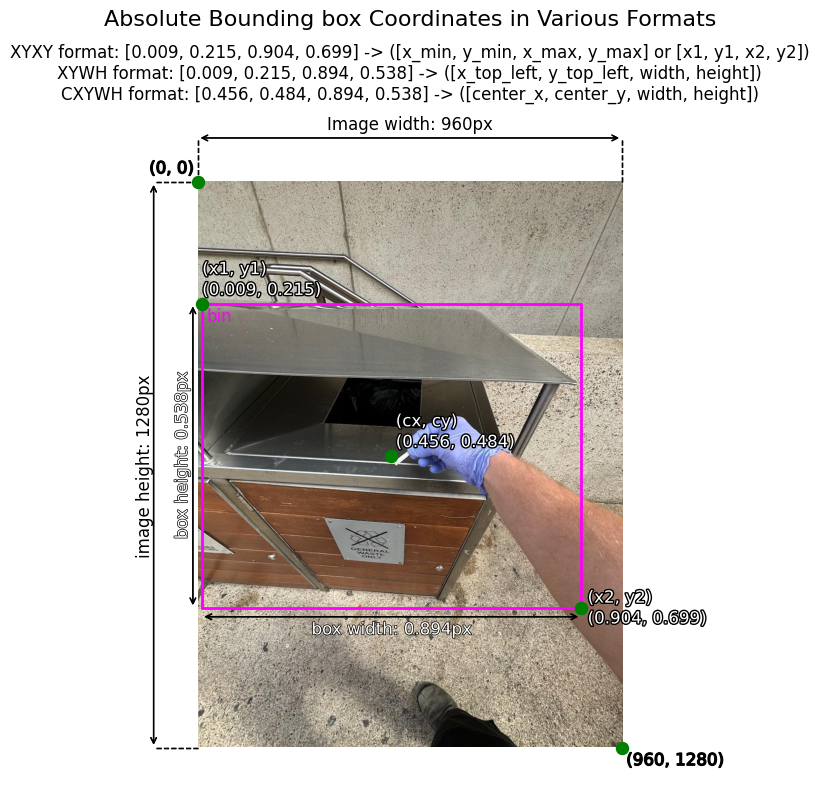

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import patheffects # Allows you to apply visual effects to plot elements like text, lines, and shapes
from PIL import Image
import numpy as np

# Read the image
image = Image.open("sample_image.jpeg")
img_width, img_height = image.size
img_array = np.array(image)

# Create figure and axis with larger figure size
fig, ax = plt.subplots(figsize=(12, 8))

# Display the image
ax.imshow(img_array)

# Add padding around the image (in pixels)
padding = 150
ax.set_xlim(-padding, img_array.shape[1] + padding)

# Create rectangle patch
rect = patches.Rectangle(
    (box_top_left_x,
     box_top_left_y),
    box_width,
    box_height,
    linewidth=2,
    edgecolor=box_colour,
    facecolor='none'
)

# Add rectangle to plot
ax.add_patch(rect)

# -------------- Add height/width image measurement lines ------------------
# Draw stretching lines from corners to measurement zone
# Style for dashed lines
dash_style = {
    'color' : 'black',
    'linestyle' : '--',
    'linewidth' : 1,
    'path_effects' : [patheffects.withStroke(linewidth=1, foreground='black')]
}

# Draw horizontal extension lines
left_x = -100 # Position in padding zone
ax.plot(
    [0, left_x],
    [0, 0],
    **dash_style
)
ax.plot(
    [0, left_x],
    [img_height, img_height],
    **dash_style
)

# Draw vertical extension lines
top_y = -100 # Position in padding zone
ax.plot(
    [0, 0],
    [0, top_y],
    **dash_style
)
ax.plot(
    [img_width, img_width],
    [0, top_y],
    **dash_style
)

# Draw measurement arrows in padding zone
# Vertical measurement
ax.annotate(
    '',
    xy=(left_x, img_height),
    xytext=(left_x, 0),
    arrowprops=dict(
        arrowstyle='<->',
        color='black',
        linewidth=1,
        path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
    )
)

# Horizontal measurement
ax.annotate(
    '',
    xy=(img_width, top_y),
    xytext=(0, top_y),
    arrowprops=dict(
        arrowstyle='<->',
        color='black',
        linewidth=1,
        path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
    )
)

# Add measurement labels
# Image height text
ax.text(
    -140, # x pos
    img_height/2, # y pos
    f'image height: {img_height}px',
    rotation=90,
    verticalalignment='center',
    fontsize=12,
    color='black',
    # path_effects = [patheffects.withStroke(linewidth=1, foreground='black')]
)

# Image width text
ax.text(
    img_width/2, # x pos
    -120, # y pos
    f'Image width: {img_width}px',
    horizontalalignment='center',
    fontsize=12,
    color='black',
    # path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
)

# --------------------- Image corner circles ------------------------------
# Add circle using scatter plot - (0, 0)
ax.scatter(
    [0],
    [0],
    color=CIRLCE_COLOUR,
    s=CIRCLE_SIZE,
    zorder=5 # Make sure it's drawn on top
)

# Add circle using scatter plot - (img_width, img_height)
ax.scatter(
    [img_width],
    [img_height],
    color=CIRLCE_COLOUR,
    s=CIRCLE_SIZE,
    zorder=5 # Make sure it is drawn on top
)

# Add coordinates text to 0, 0
ax.text(
    -110,
    -20,
    f'(0, 0)',
    color='black',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(linewidth=1, foreground='black')
    ]
)

# Add coordinates text to img_width, img_height
ax.text(
    img_width + 10,
    img_height + 40,
    f'({img_width}, {img_height})',
    color='black',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(linewidth=1, foreground='black')
    ]
)

# ----------------------- Box stroke drawings --------------------------
# Draw width measurement line
offset = 20 # pixels offset from the box
# Draw the width arrow
ax.annotate(
    '',
    xy=(box_top_left_x + box_width, box_top_left_y + box_height + offset), # arrow head
    xytext=(box_top_left_x, box_top_left_y + box_height + offset), # arrow tail
    arrowprops=dict(
        arrowstyle='<->',
        color='black',
        linewidth=1,
        path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
    )
)

# Add width labels
ax.text(
    box_top_left_x + box_width/2, # center of width
    box_top_left_y + box_height + offset + 40, # above the arrow
    f'box width: {box_width_normalized}px',
    color='white',
    fontsize=12,
    horizontalalignment='center',
    path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
)

# Draw height measurement line
offset_x = 20 # pixel offset from the box
# Draw height arrow
ax.annotate(
    '',
    xy=(box_top_left_x - offset_x, box_top_left_y + box_height), # arrow head
    xytext=(box_top_left_x - offset_x, box_top_left_y), # arrow tail
    arrowprops=dict(
        arrowstyle='<->',
        color='black',
        linewidth=1,
        path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
    )
)

# Add box height label
ax.text(
    box_top_left_x - offset_x - 45, # left of the arrow
    box_top_left_y + box_height/2, # center of height
    f'box height: {box_height_normalized}px',
    color='white',
    fontsize=12,
    verticalalignment='center',
    rotation=90,
    path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
)

# Add box label annotation
ax.text(
    box_top_left_x + 10,
    box_top_left_y + 40,
    box_label,
    color=box_colour,
    fontsize=12
)

# ---------------- Box corner circles ---------------------
# Add circle using scatter plot - (x1, y1)
ax.scatter(
    [box_top_left_x],
    [box_top_left_y],
    color=CIRLCE_COLOUR,
    s=CIRCLE_SIZE,
    zorder=5 # Make sure it's drawn on top
)

# Add circle using scatter plot - (x2, y2)
ax.scatter(
    [box_top_left_x + box_width],
    [box_top_left_y + box_height],
    color=CIRLCE_COLOUR,
    s=CIRCLE_SIZE,
    zorder=5 # Make sure it is drawn on top
)

# Add coordinates text to x1, y1
ax.text(
    0+10,
    box_top_left_y - 20,
    f'(x1, y1)\n({box_top_left_x_normalized}, {box_top_left_y_normalized})',
    color='white',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(linewidth=2, foreground='black')
    ]
)

# Add coordinates text to x2, y2
ax.text(
    box_top_left_x + box_width + 15,
    box_top_left_y + box_height + 35,
    f'(x2, y2)\n({box_bottom_right_x_normalized}, {box_bottom_right_y_normalized})',
    color='white',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(linewidth=2, foreground='black')
    ]
)

# ----------------- Box center circle ------------------------------
# Add circle using scatter plot - (cx, cy)
ax.scatter(
    [box_center_x],
    [box_center_y],
    color=CIRLCE_COLOUR,
    s=CIRCLE_SIZE,
    zorder=5 # Make sure it's drawn on top
)

# Add coordinates text to x1, y1
ax.text(
    box_center_x + 10,
    box_center_y -20,
    f'(cx, cy)\n({box_center_x_normalized}, {box_center_y_normalized})',
    color='white',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(linewidth=2, foreground='black')
    ]
)

# Remove axes
ax.set_axis_off()

plt.suptitle("""Absolute Bounding box Coordinates in Various Formats""", fontsize=16)

plt.title(f"""XYXY format: {box_xyxy_normalized} -> ([x_min, y_min, x_max, y_max] or [x1, y1, x2, y2])
XYWH format: {box_xywh_normalized} -> ([x_top_left, y_top_left, width, height])
CXYWH format: {box_cxcywh_normalized} -> ([center_x, center_y, width, height])""")

# Adjust layout to ensure everything fits
plt.tight_layout()

# Save the plot
plt.savefig("images/normalized_bounding_box_coordiantes_plot.png")

# Show plot
plt.show()

### **Drawing bounding boxes with `torchvision`**
Converting an image to tensor, drawing boxes on that tensor and then converting the tensor back to image.

Box in XYWH format: tensor([  8.9000, 275.3000, 858.6000, 688.7000])
Box XYXY: tensor([  8.9000, 275.3000, 867.5000, 964.0000])



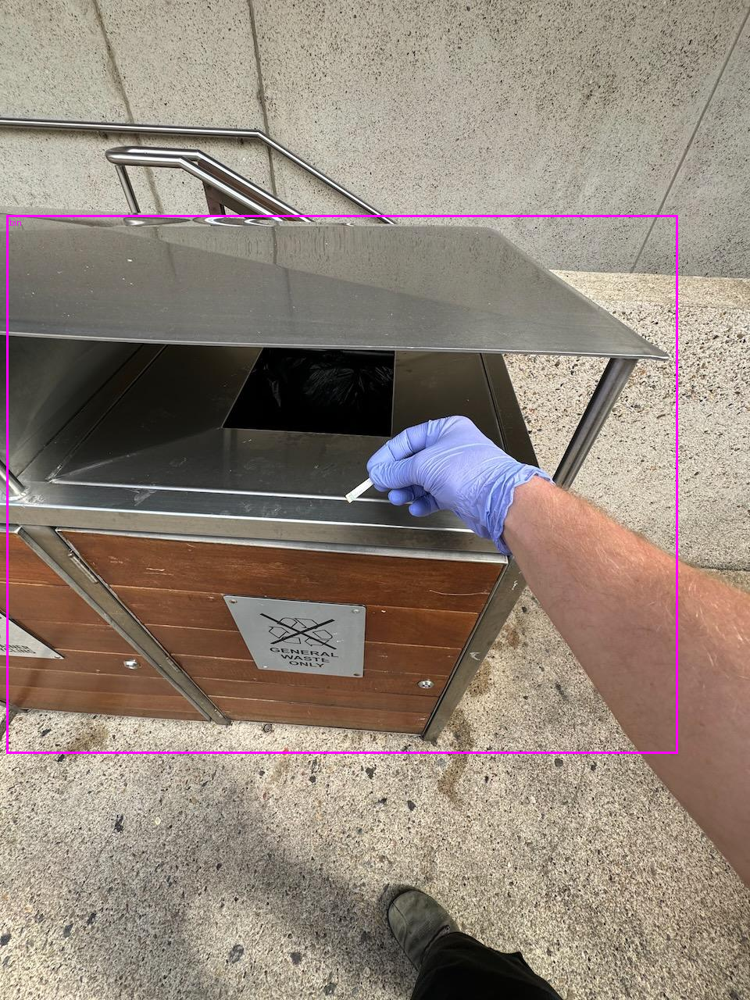

In [ ]:
from logging import warning
import torch

from torchvision.ops import box_convert
from torchvision.utils import draw_bounding_boxes
from torchvision.transforms.functional import pil_to_tensor, to_pil_image

from PIL import Image, ImageFont
import warnings

warnings.filterwarnings('ignore')

# Open the image
image = Image.open(image_path)

# Get the box coordinates in tensor form
box_xywh = torch.tensor(box_xywh)
print(f"Box in XYWH format: {box_xywh}")

# Convert boxes from XYWH -> XYXY
# torchvision.utils.draw_bounding_boxes expects input boxes in XYXY format (x_min, y_min, x_max, y_max)
box_xyxy = box_convert(boxes=box_xywh,
                       in_fmt="xywh",
                       out_fmt="xyxy")
print(f"Box XYXY: {box_xyxy}\n")

# Draw the image as a tensor and then turn it into a PIL image
to_pil_image(
    pic=draw_bounding_boxes(
        image=pil_to_tensor(pic=image),
        boxes=box_xyxy.unsqueeze(0), # requires at least one extra dimension (e.g. [[x_min, y_min, x_max, y_max]])
        colors=[box_colour], # all parameters are expected in a list/tensor format
        labels=[box_label],
        width=3,
        # font=font_filename, # you can manually assign a font otherwise `PIL.ImageFont.load_default()` is used
        font_size=30,
        label_colors=[box_colour]
    )
)